# Smap Dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
smap_test = pd.read_csv('smap_test.csv')
smap_test_label = pd.read_csv('smap_test_label.csv')
smap_test_label.rename(columns={'0':'label'},inplace=True)

smap_main = pd.concat([smap_test,smap_test_label], axis=1)
print(smap_main.shape)
smap_main.head()

(427617, 26)


,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,label
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0


In [3]:
smap_main.isnull().sum()

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
label    0
dtype: int64

In [4]:
smap_main.describe().T

,count,mean,std,min,25%,50%,75%,max
0,427617.0,-0.179944,0.775223,-1.0,-0.997772,-0.358844,0.666807,1.0
1,427617.0,0.019174,0.137135,0.0,0.000000,0.000000,0.000000,1.0
2,427617.0,0.003442,0.058570,0.0,0.000000,0.000000,0.000000,1.0
3,427617.0,0.015392,0.123107,0.0,0.000000,0.000000,0.000000,1.0
4,427617.0,0.000313,0.017699,0.0,0.000000,0.000000,0.000000,1.0
5,427617.0,0.090146,0.286391,0.0,0.000000,0.000000,0.000000,1.0
6,427617.0,0.068957,0.253381,0.0,0.000000,0.000000,0.000000,1.0
7,427617.0,0.000664,0.025762,0.0,0.000000,0.000000,0.000000,1.0
8,427617.0,0.000194,0.013931,0.0,0.000000,0.000000,0.000000,1.0
9,427617.0,0.000309,0.017567,0.0,0.000000,0.000000,0.000000,1.0


In [5]:
smap_main.columns

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       'label'],
      dtype='object')

# Time Series Analysis of Smap Data with Anomaly Indicator

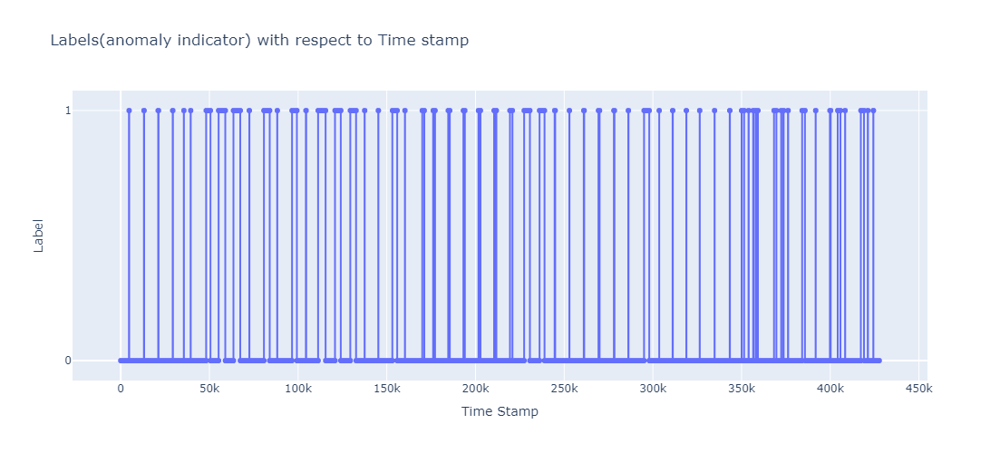

In [6]:
time_stamps = range(len(smap_main))
labels = smap_main['label']

data_to_plot = pd.DataFrame({'Time Stamp': time_stamps, 'Label': labels})

fig = px.line(data_to_plot, x='Time Stamp', y='Label', title='Labels(anomaly indicator) with respect to Time stamp', 
              markers=True, line_shape='linear', labels={'Time Stamp': 'Time Stamp', 'Label': 'Label'})
fig.update_xaxes(title_text='Time Stamp')
fig.update_yaxes(title_text='Label')
fig.update_layout(showlegend=False, yaxis=dict(tickmode='linear'), width=1000, height=500)
fig.show()


# Correlation Analysis - (Top 5 highly Correlated)

In [7]:
correlation_matrix = smap_main.corr()

label_correlations = correlation_matrix['label']

sorted_correlations = label_correlations.abs().sort_values(ascending=False)

# Print the top 5 most correlated features and their correlation values
top_5_correlations = sorted_correlations.head(6)
for feature, correlation in top_5_correlations.items():
    print(f"Feature: {feature}, Correlation: {correlation}")



Feature: label, Correlation: 1.0
Feature: 5, Correlation: 0.043705114959176915
Feature: 0, Correlation: 0.04281736541701614
Feature: 6, Correlation: 0.03887107511841458
Feature: 24, Correlation: 0.021129848840870605
Feature: 23, Correlation: 0.021129848840870605


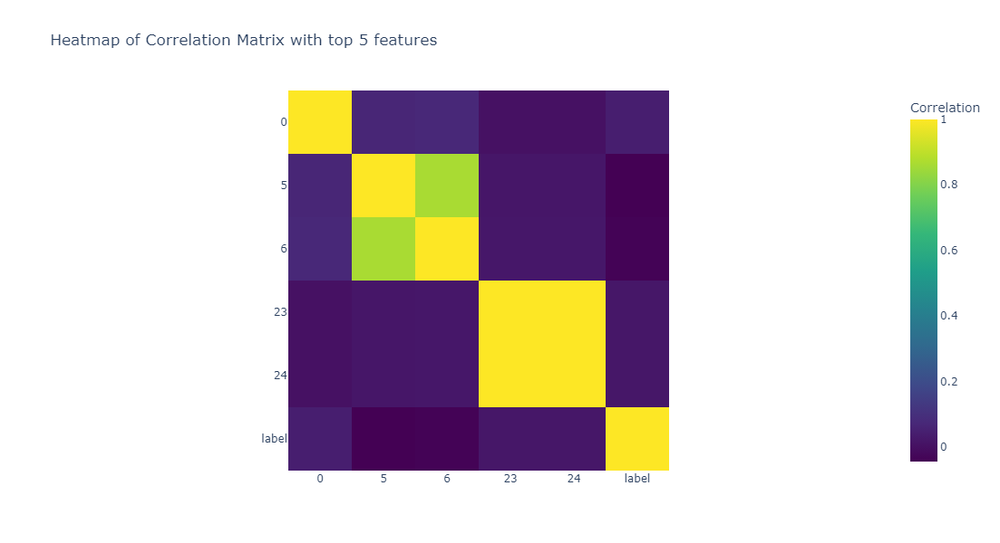

In [8]:
heatmap_columns = ['0', '5', '6', '23', '24',
       'label']

heatmap_data = smap_main[heatmap_columns]

fig = px.imshow(heatmap_data.corr(), x=heatmap_columns, y=heatmap_columns, color_continuous_scale='Viridis',
                labels=dict(color='Correlation'), title='Heatmap of Correlation Matrix with top 5 features')
fig.update_layout(height=600, width=800) 

fig.show()


# Feature Importance using Random Forest 

In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X = smap_main.drop('label', axis=1)
y = smap_main['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

feature_importances = rf.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df.head())

  Feature  Importance
0       0    0.993206
5       5    0.002060
6       6    0.001497
3       3    0.000397
1       1    0.000341


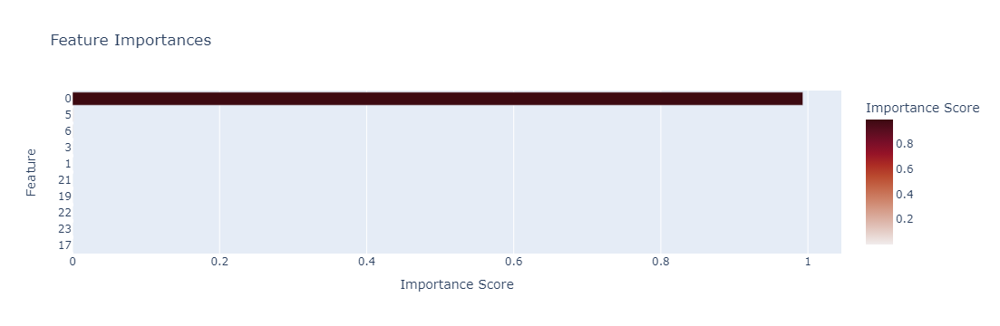

In [10]:
top_features = feature_importance_df.sort_values('Importance', ascending=False).head(10)

fig = px.bar(top_features[::-1], x='Importance', y='Feature', orientation='h', 
             title='Feature Importances', labels={'Importance':'Importance Score'},
             color='Importance', color_continuous_scale='amp')
fig.show()

# Using Mutual Informaion

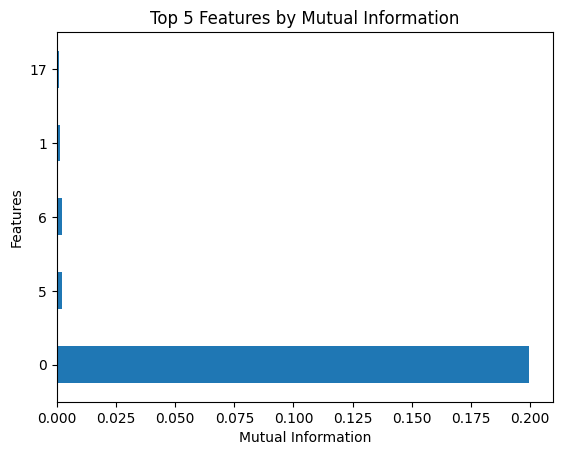

Top 5 Features by Mutual Information:
0: 0.19967572764382502
5: 0.0022960963542124624
6: 0.002151661929091997
1: 0.0014368708197012303
17: 0.0010723257192890578


In [11]:
from sklearn.feature_selection import mutual_info_classif

X = smap_main.drop('label', axis=1)
y = smap_main['label']

res = mutual_info_classif(X, y)
feat_imp = pd.Series(res, index=smap_main.columns[:-1])

top_features = feat_imp.nlargest(5)

top_features.plot(kind='barh', title='Top 5 Features by Mutual Information')
plt.xlabel('Mutual Information')
plt.ylabel('Features')
plt.show()

print("Top 5 Features by Mutual Information:")
for feature, score in top_features.items():
    print(f"{feature}: {score}")


# Feature selection using the chi-squared (chi2) statistical test

In [12]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler


X = smap_main.drop('label', axis=1)
y = smap_main['label']

scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)
chi_selector = SelectKBest(chi2, k=5)

chi_features_training = chi_selector.fit_transform(X_normalized,y)

chi_support = chi_selector.get_support()
chi_feature = X.iloc[:,chi_support].columns.tolist()

print('original Feature number: ',X.shape[1])
print(str(len(chi_feature)),'selected features')

print(chi_feature)

original Feature number:  25
5 selected features
['0', '5', '6', '23', '24']


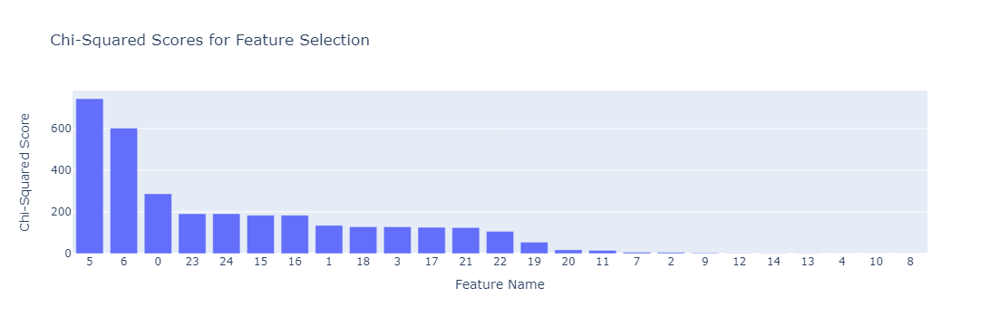

In [13]:
chi_scores = chi_selector.scores_

chi_scores_df = pd.DataFrame({'Feature': X.columns, 'Chi-Squared Score': chi_scores})

chi_scores_df_sorted = chi_scores_df.sort_values(by='Chi-Squared Score', ascending=False)

fig = px.bar(chi_scores_df_sorted, x='Feature', y='Chi-Squared Score', 
             title='Chi-Squared Scores for Feature Selection', 
             labels={'Chi-Squared Score': 'Chi-Squared Score', 'Feature': 'Feature Name'})
fig.show()


# Conclusion

### Based on the insights gained from the analysis of Smap dataset, the conclusion of the assignment can be summarized as follows:

**1. Read test and label files:**
The dataset was successfully loaded and separated into features and labels.
The 'smap_main' dataset contains features related to time series data and a 'label' column indicating anomalies.

**2. Draw time series plots with anomaly regions:**
Time series plots were created to visualize the labels (anomaly indicators) with respect to the time stamp.
These plots help in understanding the distribution of anomalies over time and identifying patterns in the data.

**3. Perform EDA and find out root cause:**
Correlation analysis was conducted to identify features most correlated with the label (anomaly indicator).
The top correlated features were identified as Feature **5**, Feature **0**, Feature **6**, Feature **24**, and Feature **23**.
These features can provide valuable insights into the factors contributing to anomalies in the dataset.

**4. Find out the variables which are the root cause for the anomaly:**
Feature importance analysis using Random Forest, mutual information, and chi-squared test was performed to identify important features.
The most important features were identified as Feature **0**, Feature **5**, Feature **6**, Feature **3**, and Feature **1** based on Random Forest analysis.
Mutual information analysis ranked Feature **0**, Feature **5**, Feature **6**, Feature **3**, and Feature **24** as the top features.
The chi-squared test selected Feature **5**, Feature **6**, Feature **0**, Feature **23**, and Feature **24** as the most relevant features.


In conclusion, the analysis has provided valuable insights into the dataset, highlighting the features most correlated with anomalies and the variables that are the root cause for anomalies. These findings can be used to further investigate and understand the underlying factors contributing to anomalies in the dataset.